# Interactive Visualization with Plotly

This tutorial is a part of the [Zero to Data Science Bootcamp by Jovian](https://zerotodatascience.com)

![](https://i.imgur.com/jPcmxke.jpg)

Plotly is a Python library used for creating interactive visualizations (graphs & charts). Unlike Matplotlib and Seaborn which create static images, Plotly renders an HTML document and uses JavaScript under the hood to enable interactivity. Plotly also offers a large selection of chart types to choose from.


The following topics are covered in this tutorial:

- Creating figures & adding interactive elements
- A quick tour of popular interactive charts
- Using Plotly as a plotting backend for Pandas 
- Creating and exploring 3D graphs
- Adding controls and animating graphs

### How to run the code

This tutorial is an executable [Jupyter notebook](https://jupyter.org) hosted on [Jovian](https://www.jovian.ai). You can _run_ this tutorial and experiment with the code examples in a couple of ways: *using free online resources* (recommended) or *on your computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing the code is to click the **Run** button at the top of this page and select **Run on Binder**. You can also select "Run on Colab" or "Run on Kaggle", but you'll need to create an account on [Google Colab](https://colab.research.google.com) or [Kaggle](https://kaggle.com) to use these platforms.


#### Option 2: Running on your computer locally

To run the code on your computer locally, you'll need to set up [Python](https://www.python.org), download the notebook and install the required libraries. We recommend using the [Conda](https://docs.conda.io/projects/conda/en/latest/user-guide/install/) distribution of Python. Click the **Run** button at the top of this page, select the **Run Locally** option, and follow the instructions.



Let's begin by installing and importing the required libraries.

In [1]:
#restart kernel after installation
!pip install jovian pandas-profiling numpy plotly --upgrade --quiet

You should consider upgrading via the 'C:\projects\python\freecodecamp-python-jovian-ai\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [4]:
import jovian
import pandas as pd
import numpy as np

## Creating Figures and Adding Interactive Elements

Like Matplotlib, Plotly provides several low-level functions for creating and customizing figures. While they offer fine grained control over various aspects of a graph, they're quite verbose and can be cumbersome to use. We'll start out by using Plotly express, a high-level API similar to Seaborn, that allows creating and customizing charts with a single line of code.

Plotly express is often imported using the alias `px`.

In [5]:
import plotly.express as px

Let's download a [country-wise population dataset](https://data.worldbank.org/indicator/SP.POP.TOTL) from World Bank Open Data.

In [4]:
population_csv_url = '/https://gist.githubusercontent.com/aakashns/bbd36fbd7c0be266f0c875ad2006a9fd/raw/1763ee47c8919995c4115bb063c99511ced34712/population.csv'
population_df = pd.read_csv(population_csv_url, index_col='Year')
population_df[:5]

,Aruba,Afghanistan,Angola,Albania,Andorra,Arab World,United Arab Emirates,Argentina,Armenia,American Samoa,...,Virgin Islands (U.S.),Vietnam,Vanuatu,World,Samoa,Kosovo,"Yemen, Rep.",South Africa,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
1960,54211.0,8996973.0,5454933.0,1608800.0,13411.0,92197753.0,92418.0,20481779.0,1874121.0,20123.0,...,32500.0,32670039.0,63689.0,3.031438e+09,108629.0,947000.0,5315355.0,17099840.0,3070776.0,3776681.0
1961,55438.0,9169410.0,5531472.0,1659800.0,14375.0,94724510.0,100796.0,20817266.0,1941492.0,20602.0,...,34300.0,33666110.0,65705.0,3.072481e+09,112105.0,966000.0,5393036.0,17524533.0,3164329.0,3905034.0
1962,56225.0,9351441.0,5608539.0,1711319.0,15370.0,97334442.0,112118.0,21153052.0,2009526.0,21253.0,...,35000.0,34683407.0,67794.0,3.125457e+09,115776.0,994000.0,5473671.0,17965725.0,3260650.0,4039201.0
1963,56695.0,9543205.0,5679458.0,1762621.0,16412.0,100034179.0,125130.0,21488912.0,2077578.0,22034.0,...,39800.0,35721217.0,69946.0,3.190564e+09,119559.0,1022000.0,5556766.0,18423161.0,3360104.0,4178726.0
1964,57032.0,9744781.0,5735044.0,1814135.0,17469.0,102832760.0,138039.0,21824425.0,2145001.0,22854.0,...,40800.0,36779999.0,72115.0,3.256065e+09,123342.0,1050000.0,5641597.0,18896307.0,3463213.0,4322861.0


Let's use `px.line` to create a line chart showing the population of Hungary from 1960 to 2019.

In [5]:
?px.line

Signature:
px.line(
    data_frame=None,
    x=None,
    y=None,
    line_group=None,
    color=None,
    line_dash=None,
    symbol=None,
    hover_name=None,
    hover_data=None,
    custom_data=None,
    text=None,
    facet_row=None,
    facet_col=None,
    facet_col_wrap=0,
    facet_row_spacing=None,
    facet_col_spacing=None,
    error_x=None,
    error_x_minus=None,
    error_y=None,
    error_y_minus=None,
    animation_frame=None,
    animation_group=None,
    category_orders=None,
    labels=None,
    orientation=None,
    color_discrete_sequence=None,
    color_discrete_map=None,
    line_dash_sequence=None,
    line_dash_map=None,
    symbol_sequence=None,
    symbol_map=None,
    markers=False,
    log_x=False,
    log_y=False,
    range_x=None,
    range_y=None,
    line_shape=None,
    render_mode='auto',
    title=None,
    template=None,
    width=None,
    height=None,
) -> plotly.graph_objs._figure.Figure
Docstring:
    In a 2D line plot, each row of `data_frame` i

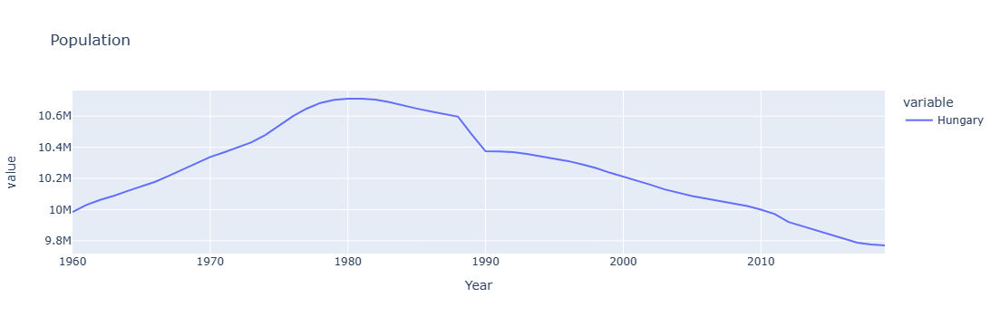

In [6]:
px.line(data_frame=population_df['Hungary'], title="Population")

Note the following:

* `px.line` automatically picks the index of the series as the X-axis. 
* You can hover over any point on the line to view the exact value.
* You can Zoom in and out using the controls to take a closer look at specific areas of the chart. 
* There are several other controls e.g pan, autoscale, download PNG etc.

For fine grained control over various aspects of the chart, we can use the Figure object returned by `px.line`. Let's change the axis labels, chart colors, and ensure that the y axis starts at 0.

In [7]:
fig = px.line(population_df['Hungary'])

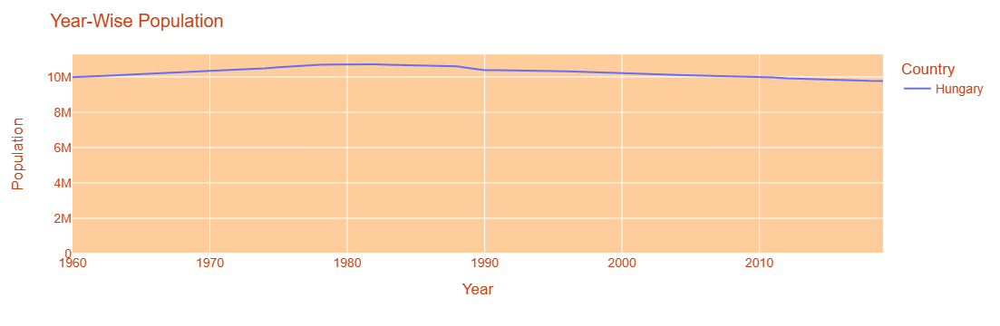

In [8]:
# Set axis & legend labels
fig.update_layout(
    title="Year-Wise Population",
    xaxis_title="Year",
    yaxis_title="Population",
    legend_title="Country",
    plot_bgcolor='#ffcc9c',
    font=dict(
        family="Arial",
        size=14,
        color="#cc3e0e"
    )
)

# Start the Y axis from 0
fig.update_yaxes(rangemode='tozero')

Here's a list of properties you can set using `update_layout`: https://plotly.com/python/reference/layout/

Plotly also has built-in support for Pandas dataframes.


**Note**: Sometimes `fig.show()` does not display the graph on your jupyter notebook then you will have to run the code shared below in a code cell.


```
#Import necessary libraries
import plotly.offline as pyo
import plotly.graph_objs as go
#Set notebook mode to work in offline
pyo.init_notebook_mode()

```

In [9]:
europe_df = population_df[['Hungary', 'Czech Republic', 'Switzerland']]
europe_df.head()

,Hungary,Czech Republic,Switzerland
Year,,,
1960,9983967.0,9602006.0,5327827.0
1961,10029321.0,9586651.0,5434294.0
1962,10061734.0,9624660.0,5573815.0
1963,10087947.0,9670685.0,5694247.0
1964,10119835.0,9727804.0,5789228.0


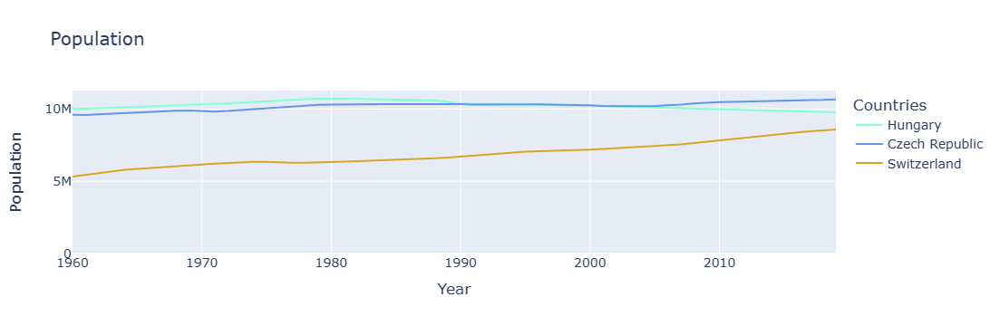

In [10]:
fig = px.line(europe_df,
              title='Population', 
              color_discrete_sequence=["aquamarine", "cornflowerblue", "goldenrod"])

fig.update_layout(yaxis_title='Population', 
                  legend_title='Countries', 
                  font_size=14)

fig.update_yaxes(rangemode='tozero')

fig.show()

Note that apart from providing RGB hexcodes for colors, we can also use named CSS colors: https://www.w3schools.com/cssref/css_colors.asp

In [11]:
?px.line

Signature:
px.line(
    data_frame=None,
    x=None,
    y=None,
    line_group=None,
    color=None,
    line_dash=None,
    symbol=None,
    hover_name=None,
    hover_data=None,
    custom_data=None,
    text=None,
    facet_row=None,
    facet_col=None,
    facet_col_wrap=0,
    facet_row_spacing=None,
    facet_col_spacing=None,
    error_x=None,
    error_x_minus=None,
    error_y=None,
    error_y_minus=None,
    animation_frame=None,
    animation_group=None,
    category_orders=None,
    labels=None,
    orientation=None,
    color_discrete_sequence=None,
    color_discrete_map=None,
    line_dash_sequence=None,
    line_dash_map=None,
    symbol_sequence=None,
    symbol_map=None,
    markers=False,
    log_x=False,
    log_y=False,
    range_x=None,
    range_y=None,
    line_shape=None,
    render_mode='auto',
    title=None,
    template=None,
    width=None,
    height=None,
) -> plotly.graph_objs._figure.Figure
Docstring:
    In a 2D line plot, each row of `data_frame` i

Switching from a line chart to a bar chart is simply a matter of replacing `plt.line` with `plt.bar`.

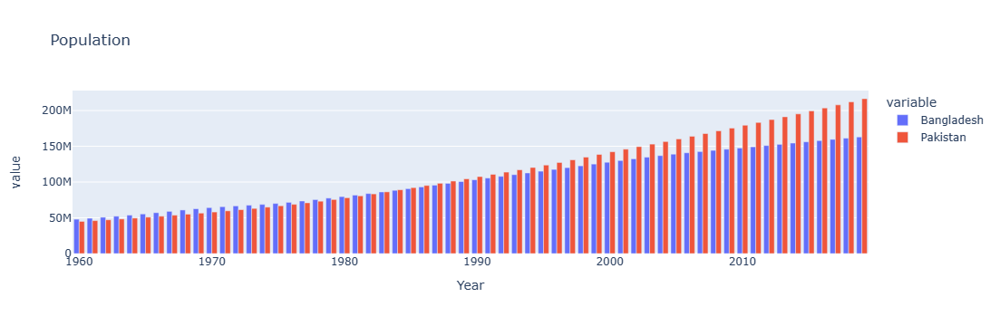

In [12]:
px.bar(population_df[['Bangladesh', 'Pakistan']], 
       title="Population", 
       barmode='group')

> **EXERCISE**: Compare the annual population increase of India and China using a line chart. Which of the two countries is growing faster? Hint: Use `population_df.diff()`

In [15]:
india_and_china = population_df[['India', 'China']].diff()

In [16]:
india_and_china

,India,China
Year,,
1960,NaN,NaN
1961,9094486.0,-6740000.0
1962,9435025.0,5440000.0
1963,9748418.0,16565000.0
1964,10022527.0,16020000.0
1965,10275189.0,16830000.0
1966,10508176.0,20215000.0
1967,10769076.0,19150000.0
1968,11113248.0,19960000.0


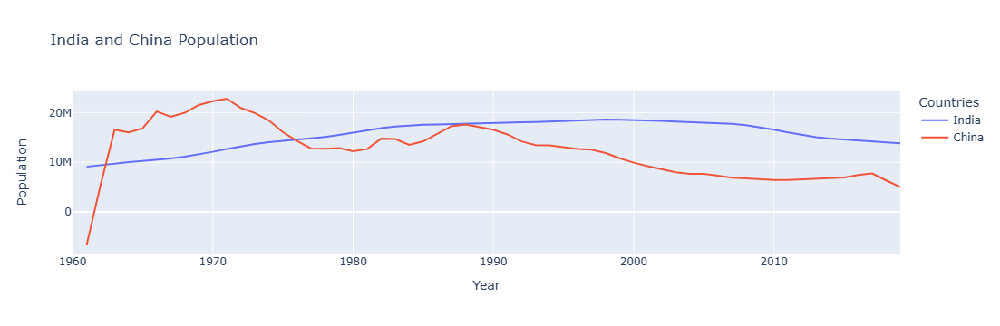

In [21]:
fig = px.line(india_and_china, title='India and China Population')
fig.update_layout(yaxis_title="Population", legend_title="Countries")

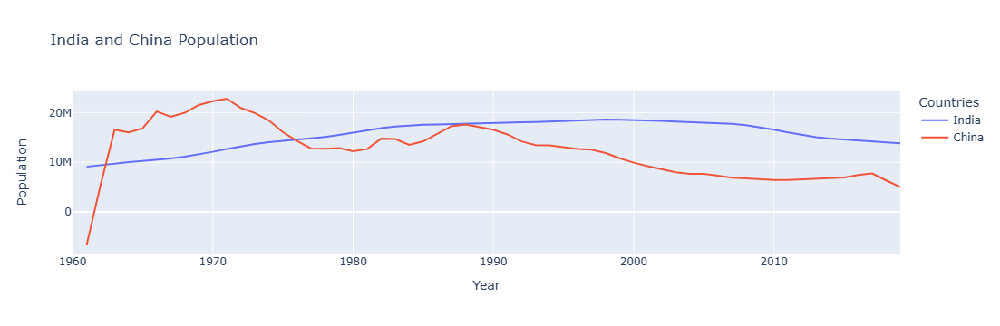

In [22]:
fig.show()

> **EXERCISE**: Compare the populations of 10 most populous African countries (as of 2019) over the last 50 years using line charts. 

In [48]:
continent_df=pd.read_csv('https://raw.githubusercontent.com/dbouquin/IS_608/master/NanosatDB_munging/Countries-Continents.csv')
african_countries=list(continent_df[continent_df['Continent']=='Africa']['Country'])

In [49]:
population_in_2019 = pd.DataFrame(population_df.loc[2019]).reset_index()

In [50]:
population_in_2019

,index,2019
0,Aruba,106314.0
1,Afghanistan,38041754.0
2,Angola,31825295.0
3,Albania,2854191.0
4,Andorra,77142.0
...,...,...
259,Kosovo,1794248.0
260,"Yemen, Rep.",29161922.0
261,South Africa,58558270.0
262,Zambia,17861030.0


In [68]:
population_in_2019.rename(columns={"index":"Country", 2019: "Population"}, inplace=True)

In [69]:
population_in_2019

,Country,Population
0,Aruba,106314.0
1,Afghanistan,38041754.0
2,Angola,31825295.0
3,Albania,2854191.0
4,Andorra,77142.0
...,...,...
259,Kosovo,1794248.0
260,"Yemen, Rep.",29161922.0
261,South Africa,58558270.0
262,Zambia,17861030.0


In [70]:
in_an_african_country = population_in_2019.Country.isin(african_countries)

In [74]:
in_an_african_country

0      False
1      False
2       True
3      False
4      False
       ...  
259    False
260    False
261     True
262     True
263     True
Name: Country, Length: 264, dtype: bool

In [78]:
top_african_countries_in_2019 = population_in_2019[in_an_african_country].sort_values('Population', ascending=False).head(10)

In [79]:
top_african_countries_in_2019

,Country,Population
172,Nigeria,200963599.0
70,Ethiopia,112078730.0
261,South Africa,58558270.0
244,Tanzania,58005463.0
119,Kenya,52573973.0
245,Uganda,44269594.0
58,Algeria,43053054.0
204,Sudan,42813238.0
146,Morocco,36471769.0
2,Angola,31825295.0


In [82]:
african_country_names =  list(top_african_countries_in_2019['Country'])

In [83]:
african_country_names

['Nigeria',
 'Ethiopia',
 'South Africa',
 'Tanzania',
 'Kenya',
 'Uganda',
 'Algeria',
 'Sudan',
 'Morocco',
 'Angola']

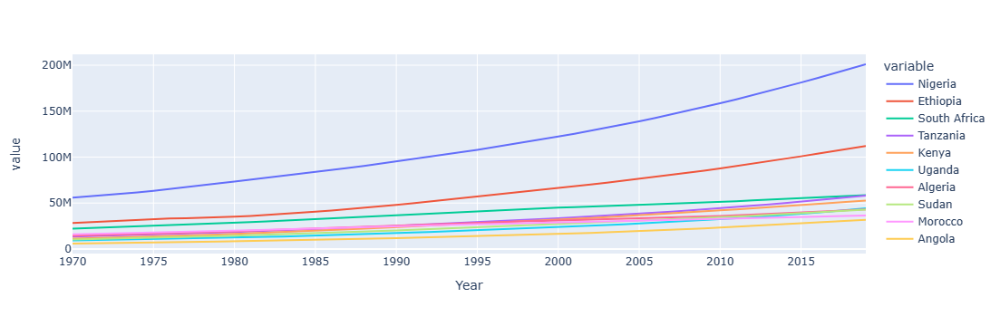

In [92]:
historical_african_population_info = population_df[african_country_names].loc[1970:]
px.line(historical_african_population_info)

> **EXERCISE**: Explore the documentation for `px.line`, `fig.update_layout` and `fig.update_yaxes`. Use their arguments to style the charts you've created.

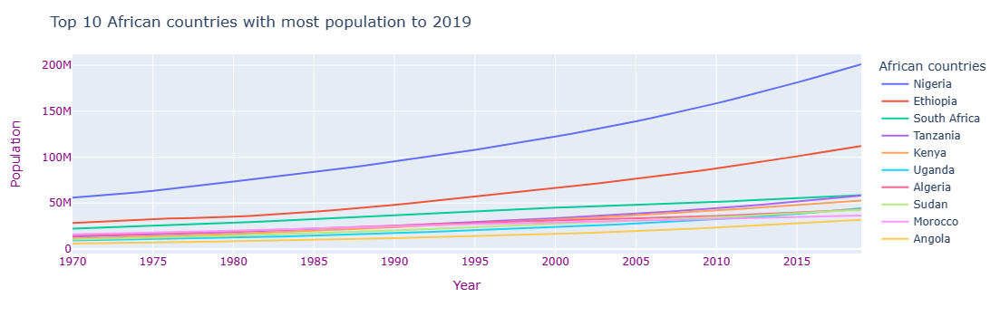

In [95]:
fig = px.line(historical_african_population_info)
fig.update_layout(yaxis_title="Population", legend_title = "African countries", title="Top 10 African countries with most population to 2019")
fig.update_yaxes(color="purple")
fig.update_xaxes(color="purple")

In [96]:
jovian.commit(filename="interactive-visualization-plotly.ipynb")

<IPython.core.display.Javascript object>

[jovian] Committed successfully! https://jovian.com/diegohdez12/interactive-visualization-plotly


'https://jovian.com/diegohdez12/interactive-visualization-plotly'

## A quick tour of popular interactive charts

Plotly express provides more than 30 figure for creating different types of figures. Let's explore some popular interactive visualization techniques. We'll use the [built-in datasets](https://plotly.com/python-api-reference/generated/plotly.express.data.html) from `px.data` to demonstrate their usage.

### Scatter Plot



In [97]:
iris_df = px.data.iris()
iris_df

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1
...,...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica,3
146,6.3,2.5,5.0,1.9,virginica,3
147,6.5,3.0,5.2,2.0,virginica,3
148,6.2,3.4,5.4,2.3,virginica,3


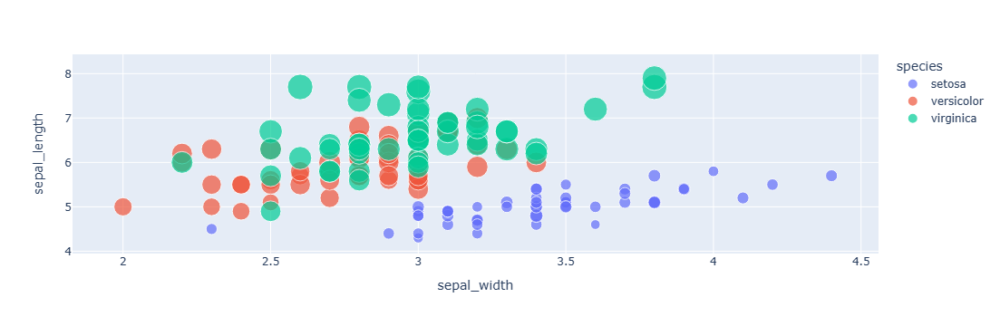

In [98]:
px.scatter(iris_df, 
           x="sepal_width", 
           y="sepal_length", 
           color="species",
           size='petal_length', 
           hover_data=['petal_width'])

> **EXERCISE**: Download the dataset `px.data.gapminder()` and visualize the relationship between GDP per capita and life expectancy in the year 2007 using a scatter plot. Set proper titles for the figure and the axes. Color the dots using the values in `continent` column, and show the country name and population on hover. 

In [99]:
px.data.gapminder()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [100]:
gapmonder = px.data.gapminder()

In [101]:
data_of_2007 = gapmonder[gapmonder.year == 2007]

In [102]:
data_of_2007

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32
...,...,...,...,...,...,...,...,...
1655,Vietnam,Asia,2007,74.249,85262356,2441.576404,VNM,704
1667,West Bank and Gaza,Asia,2007,73.422,4018332,3025.349798,PSE,275
1679,"Yemen, Rep.",Asia,2007,62.698,22211743,2280.769906,YEM,887
1691,Zambia,Africa,2007,42.384,11746035,1271.211593,ZMB,894


In [133]:
fig = px.scatter(data_of_2007, x='gdpPercap', y='lifeExp', color='continent', hover_data=['country', 'pop'], width=1080, height=840)

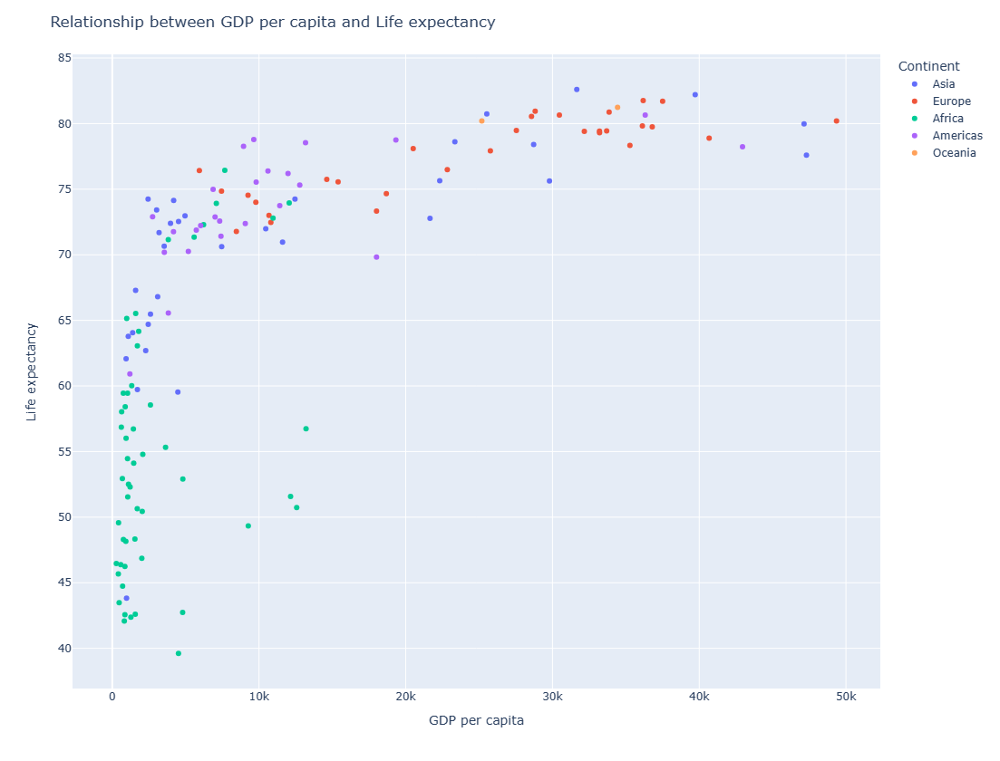

In [134]:
fig.update_layout(yaxis_title="Life expectancy", xaxis_title="GDP per capita", legend_title="Continent", title="Relationship between GDP per capita and Life expectancy")
fig.show()

### Bar Chart

We'll use the dataset `medals_long`, which contains represents the medal table for Olympic Short Track Speed Skating for the top three nations as of 2020.

In [135]:
long_df = px.data.medals_long()
long_df

,nation,medal,count
0,South Korea,gold,24
1,China,gold,10
2,Canada,gold,9
3,South Korea,silver,13
4,China,silver,15
5,Canada,silver,12
6,South Korea,bronze,11
7,China,bronze,8
8,Canada,bronze,12


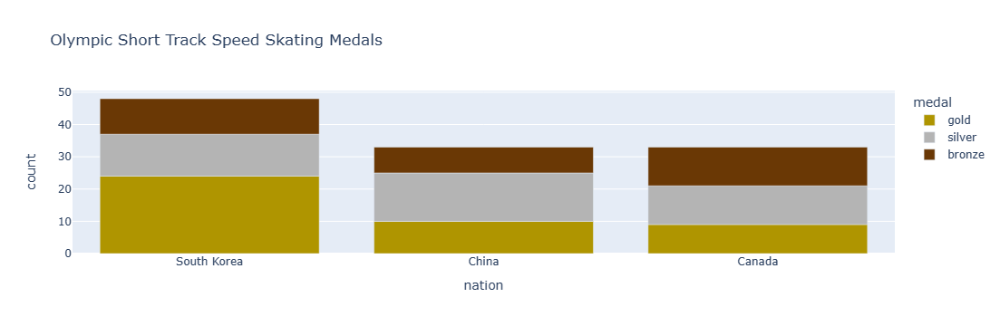

In [136]:
fig = px.bar(long_df, 
             x="nation", 
             y="count", 
             color="medal", 
             title="Olympic Short Track Speed Skating Medals",
             color_discrete_sequence=["#AF9500", "#B4B4B4", "#6A3805"])
fig.show()

> **EXERCISE**: Look up the documentation of `px.bar` and show the bars in the above chart side by side instead of stacking them on top of each other.

In [141]:
fig = px.bar(long_df, x='nation', y='count', color='medal', barmode='group', title='Olympic Short Track Speed Skating Medals', color_discrete_sequence=["#AF9500", "#B4B4B4", "#6A3805"])

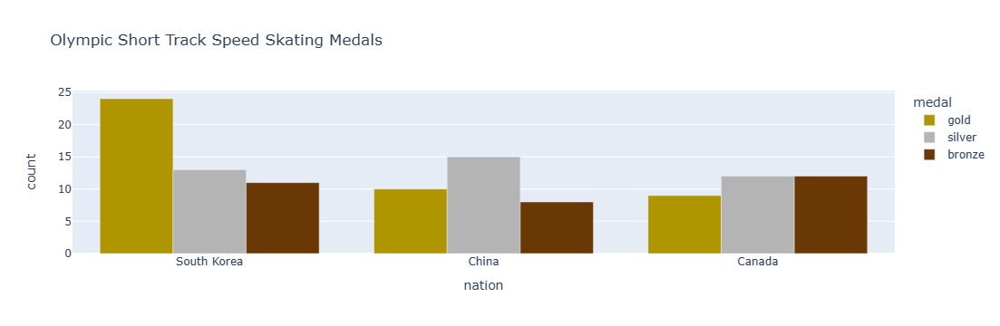

In [142]:
fig.show()

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

In [144]:
tips_df = px.data.tips()
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [147]:
fig = px.bar(tips_df, x='time', y='tip', color='sex', color_discrete_sequence=["#AF9500", "#B4B4B4"])

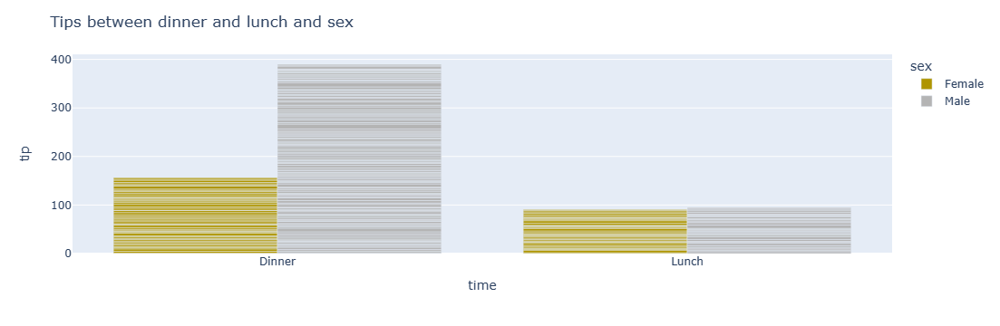

In [150]:
fig.update_layout(title="Tips between dinner and lunch and sex", barmode='group')
fig.show()

In [2]:
import jovian
jovian.commit(filename='python-matplotlib-data-visualization.ipynb')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[jovian] Updating notebook "diegohdez12/python-matplotlib-data-visualization" on https://jovian.com/
[jovian] Committed successfully! https://jovian.com/diegohdez12/python-matplotlib-data-visualization


'https://jovian.com/diegohdez12/python-matplotlib-data-visualization'

### Treemap and Sunburst

In [6]:
gapminder_df = px.data.gapminder().query("year == 2007")
gapminder_df["world"] = "World"
gapminder_df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num,world
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4,World
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8,World
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12,World
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24,World
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32,World
...,...,...,...,...,...,...,...,...,...
1655,Vietnam,Asia,2007,74.249,85262356,2441.576404,VNM,704,World
1667,West Bank and Gaza,Asia,2007,73.422,4018332,3025.349798,PSE,275,World
1679,"Yemen, Rep.",Asia,2007,62.698,22211743,2280.769906,YEM,887,World
1691,Zambia,Africa,2007,42.384,11746035,1271.211593,ZMB,894,World


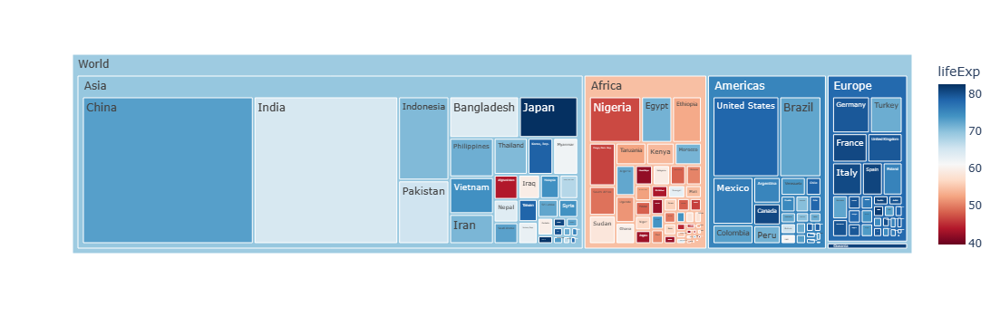

In [7]:
fig = px.treemap(gapminder_df, 
                 path=['world','continent', 'country'], 
                 values='pop',
                 color='lifeExp', 
                 color_continuous_scale='RdBu')
fig.show()

> **EXERCISE**: Replace `px.treemap` with `px.sunburst` in the above example and study the figure that's created. Can you tell what it represents?

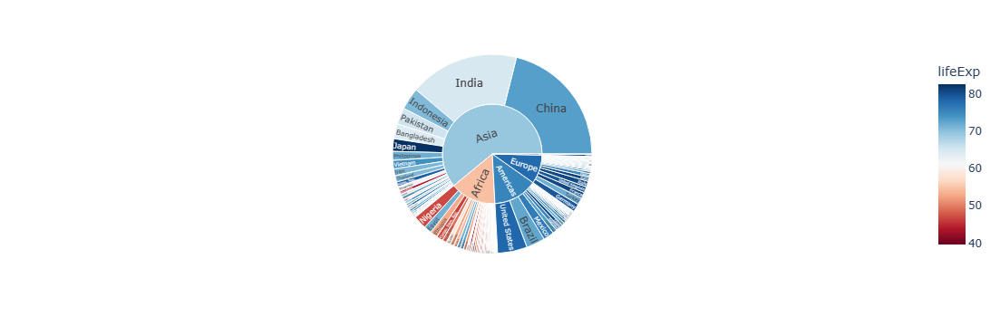

In [8]:
fig = px.sunburst(gapminder_df, 
                 path=['continent', 'country'], 
                 values='pop',
                 color='lifeExp', 
                 color_continuous_scale='RdBu')
fig.show()

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

In [11]:
elections_df = px.data.election()

In [12]:
elections_df

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112
5,113-Jeanne-Mance,1455,3599,2316,7370,Bergeron,plurality,113
6,12-Saint-Sulpice,3252,2521,2543,8316,Coderre,plurality,12
7,121-La Pointe-aux-Prairies,5456,1760,3330,10546,Coderre,majority,121
8,122-Pointe-aux-Trembles,4734,1879,2852,9465,Coderre,majority,122
9,123-Rivière-des-Prairies,5737,958,1656,8351,Coderre,majority,123


In [ ]:
fig = px.treemap(gapminder_df, 
                 path=['winner','result', 'distrct_id'], 
                 values='pop',
                 color='lifeExp', 
                 color_continuous_scale='RdBu')
fig.show()

Learn more about Treemap and Sunburst charts here: 

* https://plotly.com/python/treemaps/
* https://plotly.com/python/sunburst-charts/


### Histogram and Rug Plots

In [21]:
tips_df = px.data.tips()
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [22]:
fig = px.histogram(tips_df, 
                   x="total_bill", 
                   color="sex", 
                   marginal="rug", 
                   hover_data=tips_df.columns)
fig.show()

> **EXERCISE**: Replace `"rug"` with `"box"` or `"violin"` in the above example and study the charts. Do you understand what the marginal plots represent?

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

Learn more about histograms in Plotly here: https://plotly.com/python/histograms/

### Polar Chart

In [23]:
wind_df = px.data.wind()
wind_df

,direction,strength,frequency
0,N,0-1,0.5
1,NNE,0-1,0.6
2,NE,0-1,0.5
3,ENE,0-1,0.4
4,E,0-1,0.4
...,...,...,...
123,WSW,6+,0.1
124,W,6+,0.9
125,WNW,6+,2.2
126,NW,6+,1.5


In [24]:
fig = px.line_polar(wind_df, 
                    r="frequency",
                    theta="direction", 
                    color="strength", 
                    line_close=True,
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark")
fig.show()

> **EXERCISE**: Replace `line_polar` with `scatter_polar` or `bar_polar` in the example above and interpret the chart. When would you use one vs. the other?

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

Learn more about polar charts in plotly here: https://plotly.com/python/polar-chart/

In [66]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
[jovian] Updating notebook "aakashns/interactive-visualization-plotly" on https://jovian.ai/
[jovian] Uploading notebook..
[jovian] Capturing environment..
[jovian] Committed successfully! https://jovian.ai/aakashns/interactive-visualization-plotly


'https://jovian.ai/aakashns/interactive-visualization-plotly'

## Using Plotly as a plotting backend for Pandas

We can configure Pandas to use Plotly as the backend for the `plot` methods of Pandas data frames & series. You can learn more about this here: https://plotly.com/python/pandas-backend/. 

The Plotly backend can be enabled as follows:

In [25]:
pd.options.plotting.backend = "plotly"

The Plotly backend supports the following kinds of Pandas plots: `scatter`, `line`, `area`, `bar`, `barh`, `hist` and `box`. Let's look at some examples.

In [26]:
europe_df = population_df[['Germany', 'United Kingdom', 'France', 'Italy']]

europe_df.plot(kind='area', title="Population")

In [27]:
long_df

,nation,medal,count
0,South Korea,gold,24
1,China,gold,10
2,Canada,gold,9
3,South Korea,silver,13
4,China,silver,15
5,Canada,silver,12
6,South Korea,bronze,11
7,China,bronze,8
8,Canada,bronze,12


In [28]:
long_df.plot(x='count', 
             y='nation', 
             kind='barh', 
             color='medal', 
             barmode='group', 
             title="Olympic Short Track Speed Skating Medals",
             color_discrete_sequence=["#AF9500", "#B4B4B4", "#6A3805"])

In [29]:
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [30]:
fig = tips_df.plot('total_bill', 
                   kind='hist', 
                   title="Distribution of Total Bill")
fig.update_layout(bargap=0.1)
fig.show()

In [31]:
tips_df.plot('tip', kind='box', color='sex')

> **EXERCISE**: Replicate the above examples with different datasets. Find a dataset online or pick from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

In [80]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
[jovian] Updating notebook "aakashns/interactive-visualization-plotly" on https://jovian.ai/
[jovian] Uploading notebook..
[jovian] Capturing environment..
[jovian] Committed successfully! https://jovian.ai/aakashns/interactive-visualization-plotly


'https://jovian.ai/aakashns/interactive-visualization-plotly'

## Creating and exploring 3D graphs

Plotly can also be used to create 3D graphs. Let's look at an example of 3D surface plots, by plotting the elevation of a mountain.

In [32]:
import pandas as pd

z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv', index_col=0)
z_data

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,27.809850,49.619360,83.080670,116.66320,130.41400,150.72060,220.18710,156.15360,148.64160,203.78450,...,49.961420,21.89279,17.025520,11.743170,14.752260,13.667100,5.677561,3.312340,1.156517,-0.147662
1,27.719660,48.550220,65.213740,95.27666,116.99640,133.90560,152.34120,151.93400,160.11390,179.53270,...,33.088710,38.40972,44.248430,69.578600,4.019351,3.050024,3.039719,2.996142,2.967954,1.999594
2,30.426700,33.477520,44.809530,62.47495,77.43523,104.21530,102.73930,137.00040,186.07060,219.31730,...,48.471320,74.71461,60.090900,7.073525,6.089851,6.537450,6.666096,7.306965,5.736840,3.625628
3,16.665490,30.108600,39.969520,44.12225,59.57512,77.56929,106.89250,166.55390,175.23810,185.28150,...,60.559160,55.92124,15.172840,8.248324,36.680870,61.934130,20.268670,68.588190,46.498120,0.236010
4,8.815617,18.351600,8.658275,27.58590,48.62691,60.18013,91.32860,145.71090,116.06530,106.26620,...,47.426910,69.20731,44.954680,29.171970,17.916740,16.255150,14.655590,17.260480,31.222450,46.717040
5,6.628881,10.413390,24.819390,26.08952,30.16050,52.30802,64.71007,76.30823,84.63686,99.43240,...,140.264700,81.26501,56.457560,30.421640,17.287820,8.302431,2.981626,2.698536,5.886086,5.268358
6,21.839750,6.639270,18.970850,32.89204,43.15014,62.86014,104.66570,130.22940,114.84940,106.98730,...,122.422100,123.96980,109.095200,98.419560,77.613740,32.490310,14.673440,7.370775,0.037110,0.642339
7,53.343030,26.797970,6.639270,10.88787,17.20440,56.18116,79.70141,90.84530,98.27675,80.87243,...,68.174900,46.24076,39.938570,31.216530,36.883350,40.025250,117.429700,12.703280,1.729771,0.000000
8,25.667850,63.057170,22.141400,17.07400,41.74483,60.27227,81.42432,114.44400,102.32340,101.78780,...,59.193550,42.47175,14.635980,6.944074,6.944075,27.749360,0.000000,0.000000,0.094494,0.077323
9,12.827000,69.205540,46.762930,13.96517,33.88744,61.82613,84.74799,121.12200,145.27410,153.17970,...,79.344250,25.93483,6.944074,6.944074,6.944075,7.553681,0.000000,0.000000,0.000000,0.000000


We need to use the low level `graph_objects` API to create a 3d surface and attach it to a figure.

In [33]:
import plotly.graph_objects as go

surface=go.Surface(z=z_data.values)
fig = go.Figure(surface)
fig.update_layout(title='Mt. Bruno Elevation')
fig.show()

Plotly express can be used to create 3D linear and scatter plots.

In [34]:
df = px.data.gapminder().query("country=='Brazil'")
fig = px.line_3d(df, x="gdpPercap", y="pop", z="year")
fig.show()

In [35]:
iris_df

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1
...,...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica,3
146,6.3,2.5,5.0,1.9,virginica,3
147,6.5,3.0,5.2,2.0,virginica,3
148,6.2,3.4,5.4,2.3,virginica,3


In [36]:
px.scatter_3d(iris_df, 
              x='sepal_length', 
              y='sepal_width', 
              z='petal_width', color='species')

> **EXERCISE**: Create some 3D surface, line and scatter plots using some other datasets.

In [86]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
[jovian] Updating notebook "aakashns/interactive-visualization-plotly" on https://jovian.ai/
[jovian] Uploading notebook..
[jovian] Capturing environment..
[jovian] Committed successfully! https://jovian.ai/aakashns/interactive-visualization-plotly


'https://jovian.ai/aakashns/interactive-visualization-plotly'

## Adding controls and animating graphs

Plotly express graphs can be animated by specifying an `animation_frame` column. Additionally, an `animation_group` can be specified to uniquely identify objects across frames. An animated graph also provides slider controls to skip to any frame.

In [37]:
df = px.data.gapminder()
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [38]:
df = px.data.gapminder()

fig = px.scatter(df, 
                 x="gdpPercap", 
                 y="lifeExp", 
                 animation_frame="year", 
                 animation_group="country",
#                  size="pop",     
                 color="continent", 
                 hover_name="country",
                 log_x=True, 
                 size_max=80, 
                 range_x=[100,100000], 
                 range_y=[25,90])

fig.show()

In [39]:
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [39]:
px.box(tips_df, x='sex', y='total_bill', color='smoker', animation_frame='day')

> **EXERCISE**: Create some graphs with controls an animations using other datasets.

Learn more about Plotly animations and custom controls here: https://plotly.com/python/#controls

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..


## Summary and Further Reading

We've covered the following topics in this tutorial:

- Creating figures & adding interactive elements
- Replicating common graphs using Plotly
- Using Plotly as a plotting backend for Pandas 
- Creating and exploring 3D graphs
- Adding controls and animating graphs



## Questions for Revision
1.	What is Plotly?
2.	How is Plotly different from Matplotlib and Seaborn?
3.	How do you plot line chart with Plotly? Illustrate with an example.
4.	What is the difference between `plt.bar`, `sns.barplot` and `px.bar`?
5.	What are the popular interactive charts in Plotly?
6.	What is the `color_discrete_sequence parameter` in Plotly?
7.	How do you set titles for axes in Plotly?
8.	What is `hover_data` parameter in Plotly?
9.	How do you plot sunburst chart with Plotly? Illustrate with an example.
10.	Illustrate the usage of a Treemap in Plotly.
11.	What is marginal parameter in Plotly?
12.	What is a polar chart? Illustrate with an example.
13.	How can you use Plotly as backend for plot methods in Pandas dataframes and series? 
14.	What is a boxplot? Plot it using Plotly.
15.	What is `graph_objects` in Plotly?
16.	How do you import `graph_objects`?
17.	What kind of 3D plots can you be plotted using Plotly?
18.	What is an animated graph? Illustrate with an example.
19.	What is an `animation_frame`?
20.	What is an `animation_group`?

## Solutions for Exercises


> **EXERCISE**: Compare the annual population increase of India and China using a line chart. Which of the two countries is growing faster? Hint: Use `population_df.diff()`

In [40]:
annual_population_increase_df = population_df[["India", "China"]].diff(axis = 0)

In [41]:
fig =px.line(annual_population_increase_df, title = 'Annual population increase of India and China')
fig.update_layout(yaxis_title='Population Increase', 
                  xaxis_title='Year',
                  legend_title='Countries')
fig.show()

**OBSERVATION**: Toppr - Rapid growth of population is known as *Exponential growth* where the population is increased with the constant increasing birth rate. From the above graph, China has a rapid growth and decrease in population where as India has a consistent growth of population over the years.

> **EXERCISE**: Compare the populations of 10 most populous African countries (as of 2019) over the last 50 years using line charts. 

In [42]:
continent_df=pd.read_csv('https://raw.githubusercontent.com/dbouquin/IS_608/master/NanosatDB_munging/Countries-Continents.csv')
african_countries=list(continent_df[continent_df['Continent']=='Africa']['Country'])

In [43]:
population_of_2019=pd.DataFrame(population_df.loc[2019]).reset_index()
population_of_2019.rename(columns = {'index':'Country', 2019:'Population'}, inplace = True)
is_african_country = population_of_2019.Country.isin(african_countries)
top_10_african_countries = population_of_2019[is_african_country].sort_values('Population', ascending = False).head(10)
list_of_top_10_african_countries = list(top_10_african_countries['Country'])
Most_populous_african_countries = population_df[list_of_top_10_african_countries].loc[1970:]

In [44]:
fig = px.line(Most_populous_african_countries)
fig.show()

**OBSERVATION**: Nigeria has the highest population growth in the last 50 years.

> **EXERCISE**: Explore the documentation for `px.line`, `fig.update_layout` and `fig.update_yaxes`. Use their arguments to style the charts you've created.

In [45]:
fig = px.line(Most_populous_african_countries,title='Top 10(2019) African countries population growth over 50 years')
fig.update_layout(yaxis_title='Population', 
                  xaxis_title='Year',
                  legend_title='Countries')
fig.update_xaxes(color='brown')
fig.update_yaxes(color='brown')

> **EXERCISE**: Download the dataset `px.data.gapminder()` and visualize the relationship between GDP per capita and life expectancy in the year 2007 using a scatter plot. Set proper titles for the figure and the axes. Color the dots using the values in `continent` column, and show the country name and population on hover. 

In [46]:
gapminder_df=px.data.gapminder()

In [47]:
data_of_2007 = gapminder_df[gapminder_df.year ==2007]

In [48]:
fig=px.scatter(data_of_2007, 
           x="gdpPercap", 
           y="lifeExp", 
           color="continent", 
           hover_data=['country',"pop"],
           title='Relationship between GDP per capita and life expectancy in the year 2007')
fig.update_layout(xaxis_title='GDP per capita', 
                  yaxis_title='Life expectancy',
                  legend_title='Continent')

**OBSERVATION**: GDP per capita and life expectancy in the year 2007 seem to have a 'curvilinear relationship'. 
- Curvilinear relationship - A Curvilinear Relationship is a type of relationship between two variables where as one variable increases, so does the other variable, but only up to a certain point, after which, as one variable continues to increase, the other decreases.

> **EXERCISE**: Look up the documentation of `px.bar` and show the bars in the above chart side by side instead of stacking them on top of each other. 

- [*Reference to Bar Chart `long_df` visualization.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C42)

In [49]:
fig = px.bar(long_df, 
             x="nation", 
             y="count", 
             color="medal", 
             title="Olympic Short Track Speed Skating Medals",
             barmode = "group",
             color_discrete_sequence=["#AF9500", "#B4B4B4", "#6A3805"])
fig.show()

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

- [*Reference to Bar chart visualization exercise*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C42)

In [50]:
tips_df =  px.data.tips()

In [51]:
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [52]:
fig = px.bar(tips_df,
            x="time",
            y="tip",
            color="sex",
            title = "Tips received at different times of the day",
            barmode='group',
            color_discrete_sequence=["#AF9500", "#B4B4B4"])
fig.show()            

**OBSERVATION**: Tips for male during the dinner time of the day are highest. Insteresting. Evening/Night shifts are taken up by men mostly and that could possibly be the reason for the huge difference. 

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

- [*Reference to treemap and sunburst visualization exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C52)

In [53]:
elections = px.data.election()
elections.head(5)

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112


In [54]:
fig = px.treemap(elections,
               path=["winner","result","district_id"],
               values= "total",
               color_continuous_scale="RdBu")
fig.show()

In [55]:
fig = px.sunburst(elections,
               path=["winner","result","district_id"],
               values= "total",
               color_continuous_scale="RdBu")
fig.show()

**OBSERVATION**: Coderre has highest number of votes with maximum plurality wins and Joly has has the least number of votes with only two majority wins.

> **EXERCISE**: Replace `"rug"` with `"box"` or `"violin"` in the above example and study the charts. Do you understand what the marginal plots represent?

- [*Reference to `tips_df` histogram visualization.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C62)

In [56]:
fig = px.histogram(tips_df, 
                   x="total_bill", 
                   color="sex", 
                   marginal="box", 
                   hover_data=tips_df.columns)
fig.show()

In [57]:
fig = px.histogram(tips_df, 
                   x="total_bill", 
                   color="sex", 
                   marginal="violin", 
                   hover_data=tips_df.columns)
fig.show()

**OBSERVATION**: Marginal plots represent the small subplots above the main plot, which show the distribution of data along only one dimension. 

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

- [*Reference to histogram visualization exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C62)

In [58]:
car_share=px.data.carshare()
car_share

,centroid_lat,centroid_lon,car_hours,peak_hour
0,45.471549,-73.588684,1772.750000,2
1,45.543865,-73.562456,986.333333,23
2,45.487640,-73.642767,354.750000,20
3,45.522870,-73.595677,560.166667,23
4,45.453971,-73.738946,2836.666667,19
...,...,...,...,...
244,45.547171,-73.556258,951.416667,3
245,45.546482,-73.574939,795.416667,2
246,45.495523,-73.627725,425.750000,8
247,45.521199,-73.581789,1044.833333,17


In [59]:
fig = px.histogram(car_share, 
                   x="car_hours", 
                   marginal="rug", 
                   hover_data=car_share.columns)
fig.show()

In [60]:
fig = px.histogram(car_share, 
                   x="car_hours", 
                   marginal="box", 
                   hover_data=car_share.columns)
fig.show()

In [61]:
fig = px.histogram(car_share, 
                   x="car_hours", 
                   marginal="violin", 
                   hover_data=car_share.columns)
fig.show()

**OBSERVATION**: `car_hours` seem to follow a normal distribution with few outliers.

> **EXERCISE**: Replace `line_polar` with `scatter_polar` or `bar_polar` in the example above and interpret the chart. When would you use one vs. the other?

- [*Reference to `wind_df` polar chart visualization.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C74)

In [62]:
fig = px.scatter_polar(wind_df, 
                    r="frequency",
                    theta="direction", 
                    color="strength", 
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark")
fig.show()

In [63]:
fig = px.bar_polar(wind_df, 
                    r="frequency",
                    theta="direction", 
                    color="strength",
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark")
fig.show()

**OBSERVATION**: Bar polar charts are mostly used for categorical data where as scatter polar charts are used for data containing amount and direction values.

> **EXERCISE**: Replicate the above example with a different dataset. Find a dataset online or pick one from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

- [*Reference to polar chart visualization exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C74)

In [64]:
tips_df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [65]:
fig = px.scatter_polar(tips_df, 
                    r="total_bill",
                    theta="day", 
                    color="time",
                    template="plotly_dark")
fig.show()


**OBSERVATION**: Dinner time of the day during weekends recorded the highest paid bills at the restaurant.

In [75]:
fig = px.bar_polar(tips_df, 
                    r="tip",
                    theta="day", 
                    color="time",
                    template="plotly_dark")
fig.show()


**OBSERVATION**: Dinner time of the day during weekends received the maximum number of tips.

> **EXERCISE**: Replicate the above examples with different datasets. Find a dataset online or pick from this page: https://plotly.com/python-api-reference/generated/plotly.express.data.html

- [*Reference to Using Plotly as a plotting backend for Pandas exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C83)

In [67]:
elections.head()

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112


In [68]:
elections.plot(x='total', 
             y='winner',  
             color='result', 
             kind='barh',
             barmode='group',
             title="Elections total votes of the winners",
             color_discrete_sequence=["#AF9500", "#B4B4B4", "#6A3805"])

**OBSERVATION**: Coderre has highest number of votes with maximum plurality wins and Joly has has the least number of votes with only two majority wins.

In [82]:
fig = elections.plot('winner', 
                   kind='hist', 
                   title="Distribution of Winners")
fig.update_layout(bargap=0.1)
fig.show()

**OBSERVATION**: Coderre has the maximum number of entries in the `elections` dataset indicating that this person must have won elections in many districts. 

In [86]:
gapminder_df.plot('lifeExp', kind='box', color='continent')

**OBSERVATION**: Europe and African continents have more outliers when compared to other continents in Life Expextancy. Asia has the highest Life Expectancy with 82.6 years and Africa the least Life Expectancy with 23.5 years.

> **EXERCISE**: Create some 3D surface, line and scatter plots using some other datasets.

- [*Reference to Creating and exploring 3D graphs exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C96)

In [90]:
px.scatter_3d(elections, 
              x='winner', 
              y='total', 
              z='Joly', color='result')

> **EXERCISE**: Create some graphs with controls an animations using other datasets.

- [*Reference to Adding controls and animating graphs exercise.*](https://jovian.ai/aakashns/interactive-visualization-plotly/v/18#C108)

In [72]:
df = px.data.carshare()
df.sort_values(by='peak_hour',inplace=True)

In [73]:
fig = px.bar(df, 
                 x=df.index, 
                 y="car_hours", 
                 animation_frame="peak_hour",  
                 log_x=True,
                 range_x=[10,100])

fig.show()